# <center> Кластеризация изображений транспортных средств

## Постановка задачи

<center> <img src=https://i.ibb.co/t8DvkyB/smart-city-image-1.jpg align="right" width="300"/> </center>
<center> <img src=https://i.ibb.co/qYkWNVh/smart-city-image-3.jpg align="right" width="300"/> </center>


Один из ключевых проектов IntelliVision — Smart City/Transportation, система, обеспечивающая безопасность дорожного движения и более эффективную работу парковок. С помощью Smart City/Transportation можно контролировать сигналы светофоров и соблюдение ограничений скорости, определять виды транспортных средств, распознавать номерные знаки, считать автомобили и людей.

В основе всех перечисленных возможностей проекта лежит CV (Compu5ter Vision, компьютерное зрение). Чтобы их реализовать, компания использует модели, для обучения которых применяются огромные размеченные датасеты с изображениями транспортных средств. Однако система работает в режиме реального времени и с каждым днём данных становится всё больше. Алгоритм нуждается в постоянной модернизации и должен учитывать множество факторов.

Для модификации и повышения эффективности системы Smart City/Transportation команде необходимо автоматизировать определение дополнительных параметров авто на изображении:

* тип автомобиля (кузова),
* ракурс снимка (вид сзади/спереди),
* цвет автомобиля,
* другие характеристики.

Также необходимо автоматизировать поиск выбросов в данных (засветы и блики на изображениях, изображения, на которых отсутствуют автомобили и т. д.).

К сожалению, у компании нет комплексной модели, которая могла бы одновременно находить на изображении автомобиль и определять все нужные параметры. Её нужно построить, однако многокомпонентная разметка новых данных по всем этим параметрам — очень трудозатратное занятие, которое стоит больших денег.

При решении задачи разметки данных у команды возникла гипотеза, которая нуждается в исследовании.


**Гипотеза:** разметку исходных данных можно эффективно провести с помощью методов кластеризации. 


**В чём идея?**

*Давайте будем использовать небольшой набор моделей свёрточных нейронных сетей, обученных на различных датасетах и решающих различные задачи от классификации изображений по цвету до классификации типов транспортных средств, пропустим нашу базу изображений через каждую модель, но возьмём не выходной результат модели, а только промежуточное представление признаков (дескриптор), полученное на свёрточных слоях сети.*

*Выполним такую операцию для всех изображений из набора данных, на основе полученных дескрипторов кластеризуем изображения, проинтерпретируем полученные кластеры и попробуем найти в них необходимую информацию.*

Теперь, когда мы обсудили гипотезу, перейдём к постановке задачи.

<center> <img src=https://i.ibb.co/hLcBpZF/2023-03-27-12-11-17.png align="right" width="500"/> </center>

У вас будет набор из 416 314 изображений транспортных средств различных типов, цветов и снятых с разных ракурсов.

Команда IntelliVision уже обработала свой набор данных с помощью нескольких моделей глубокого обучения (свёрточных нейронных сетей) и получила четыре варианта вектора признаков (дескрипторов) для каждого изображения.

**Ваша задача** — используя готовые дескрипторы, разбить изображения на кластеры и проинтерпретировать каждый из них. Для всех вариантов дескрипторов нужно применить несколько алгоритмов кластеризации и сравнить полученные результаты. Сравнивать можно на основе метрик, визуализаций плотностей кластеров и по тому, насколько хорошо интерпретируются кластеры.

Дополнительная подзадача — найти выбросы среди изображений. Это могут быть изображения плохого качества, изображения с бликами или изображения, на которых нет транспортных средств и т. д.

Бизнес-задача: исследовать возможность применения алгоритмов кластеризации для разметки новых данных и поиска выбросов.

Техническая задача для вас как для специалиста в Data Science: построить модель кластеризации изображений на основе дескрипторов, выделяемых с помощью различных архитектур нейронных сетей, проинтерпретировать полученные результаты и выбрать модель или комбинацию моделей, которая выделяет наиболее пригодные для интерпретации признаки.

**Ваши основные цели:**
1. Для каждого типа дескрипторов необходимо:
    * выполнить предобработку дескрипторов;
    * произвести кластеризацию изображений на основе их дескрипторов, подобрав алгоритм и параметры кластеризации;
    * сделать визуализацию полученных кластеров в 2D- или 3D-пространстве;
    * проинтерпретировать полученные кластеры — в паре предложений сформулировать, какие изображения попали в каждый из кластеров.
2. Сравнить между собой полученные кластеризации для каждого типа дескрипторов (по метрикам, визуализации и результатам интерпретации).
3. Выполнить автоматизированный поиск выбросов среди изображений на основе дескрипторов.
4. Дополнительная задача (не оценивается): попробовать воспользоваться смесью дескрипторов, полученных различными моделями, и проинтерпретировать полученные результаты.

**Примечание.** При выборе алгоритма кластеризации следует ориентироваться на внутренние метрики, а именно на индекс Калински — Харабаса (`calinski_harabasz_score`) и индекс Дэвиса — Болдина (`davies_bouldin_score`), а также на интерпретируемость кластеров и визуализацию.

## Данные и их описание

Исходная папка с данными имеет следующую структуру:

```
IntelliVision_case
├─descriptors
    └─efficientnet-b7.pickle
    └─osnet.pickle
    └─vdc_color.pickle
    └─vdc_type.pickle
├─row_data
    └─veriwild.zip
├─images_paths.csv 
```

Давайте разберёмся в ней:

* В папке `descriptors` содержатся дескрипторы, полученные для каждого из изображений с помощью соответствующих нейронных сетей, в формате numpy-массивов, сохранённых в файлах pickle:
    * `efficientnet-b7.pickle` — дескрипторы, выделенные моделью классификации с архитектурой EfficientNet версии 7. Эта модель является свёрточной нейронной сетью, предобученной на на датасете ImageNet, в котором содержатся изображения более 1000 различных классов. Эта модель при обучении не видела датасета veriwiId. 

    * `osnet.pickle` — дескрипторы, выделенные моделью OSNet, обученной для детектирования людей, животных и машин. Модель не обучалась на исходном датасете veriwiId.

    * `vdc_color.pickle` — дескрипторы, выделенные моделью регрессии для определения цвета транспортных средств в формате RGB. Частично обучена на исходном датасете veriwild.
    
    * `vdc_type.pickle` — дескрипторы, выделенные моделью классификации транспортных средств по типу на десяти классах. Частично обучена на исходном датасете veriwild.

* В папке `row_data` содержится zip-архив с исходными изображениями автомобилей. Распакуйте его содержимое в папку row_data. Архив содержит десять папок с изображениями, пронумерованных от 1 до 10. Каждая папка содержит подпапки, обозначенные пятизначными цифрами, например 36191. 

В каждой из таких подпапок содержатся фотографии одного конкретного автомобиля с разных ракурсов, снятые с помощью дорожных видеокамер.

* В файле `images_paths.csv` представлен список из полных путей до изображений. Он пригодится вам при анализе изображений, попавших в определённый кластер.


Импорт базовых библиотек:

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots

import warnings 
import os

from IPython.display import display, HTML

warnings.filterwarnings("ignore")

plt.rcParams["patch.force_edgecolor"] = True

import pickle
import memory_profiler

input_path = './IntelliVision_case/'
output_path = './output/'


files = ['efficientnet-b7','osnet','vdc_color','vdc_type']

%load_ext memory_profiler


## 1. Знакомство со структурой данных

Прочитайте numpy-массивы из предоставленных pickle-файлов.

**Примечание** Для удобства дальнейшей работы вы можете составить четыре DataFrame с путями до изображений и соответствующими им дескрипторами.

Посмотрите на размерности каждой из четырёх заданных матриц и сравните использованные модели глубокого обучения по размерностям выходных дескрипторов изображений. 


In [36]:
data = {} 

def load_data(file_name=''):
    X = pd.DataFrame(pickle.load(open(input_path+'Descriptors/'+file_name+'.pickle','rb')))
    print ('File:',file_name,' Минимальное значение =',round(X.min().min(),4),'Максимальное =',round(X.max().max(),4),'Cреднее =', round(X.mean().mean(),4))
    print ('File:',file_name,' Количество наблюдений и количество признаков =  ', X.shape)
    return X

for file in files:
    data[file]=load_data(file)

File: efficientnet-b7  Минимальное значение = -0.2652 Максимальное = 2.02 Cреднее = 0.0407
File: efficientnet-b7  Количество наблюдений и количество признаков =   (416314, 2560)
File: osnet  Минимальное значение = 0.0 Максимальное = 33.5021 Cреднее = 0.8867
File: osnet  Количество наблюдений и количество признаков =   (416314, 512)
File: vdc_color  Минимальное значение = -3.7716 Максимальное = 2.1523 Cреднее = -0.4138
File: vdc_color  Количество наблюдений и количество признаков =   (416314, 128)
File: vdc_type  Минимальное значение = 0.0 Максимальное = 2.5675 Cреднее = 0.1378
File: vdc_type  Количество наблюдений и количество признаков =   (416314, 512)


Вывод: Во всех моделях равное количество наблюдений и наибольшее количество признаков в модели efficientnet-b7. Мы также проверили дипазоны значений до масштабирования.

## 2. Преобразование, очистка и анализ данных

Признаки, найденные с помощью некоторых моделей, исчисляются тысячами, что довольно много, учитывая общее количество наблюдений.

Как вы понимаете, производить кластеризацию на таком большом количестве признаков, которые были сформированы исходными моделями глубокого обучения, довольно сложно и затратно по времени. К тому же, многие признаки, найденные моделями на изображениях, могут быть сильно скоррелированы между собой.

Понизьте размерность исходных дескрипторов с помощью соответствующих методов. Можно уменьшить размерность входных данных до 100 или 200 признаков — этого будет достаточно, чтобы произвести кластеризацию, однако рекомендуем вам самостоятельно подобрать необходимое количество компонент в новом пространстве признаков.

Также позаботьтесь о масштабе признаков, воспользовавшись стандартизацией и нормализацией. После кластеризации определите, какой вариант масштабирования более успешен для каждого варианта дескрипторов.


In [2]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, Normalizer

def pca_transformer(X,model):
    #минимальное число компонент, которые суммарно могут объяснить как минимум 90 % разброса данных
    pca = PCA(n_components=0.9, random_state=42).fit(X)
    print('Model = {}, n_components = {}'.format(model,len(pca.components_)))
    return pca.transform(X)

X_pca = {}

filename = output_path+'X_pca.pickle'

if os.path.isfile(filename): 
    # загружаем ранее рассчитанные данные если таковые имеются
    print ('Загружаем:',filename) 
    X_pca = pickle.load(open(filename, 'rb'))
else: 
    # масштабируем данные
    std = StandardScaler()
    norm = Normalizer()
    X_scaled = {}
    for file in files:
        X_scaled[file+'-'+'std'] = std.fit_transform(data[file])
        X_scaled[file+'-'+'norm'] = norm.fit_transform(data[file])
    #выполняем расчет для всех вариантов масштабированных данных
    for i, model in enumerate(X_scaled):
        X_pca[model] = pca_transformer(X_scaled[model],model)
        #сохраняем результат для использования повторно
        with open(filename, 'wb') as handle:
            pickle.dump(X_pca, handle, protocol=pickle.HIGHEST_PROTOCOL)
            print ('Cохраняем:',filename) 

Загружаем: ./output/X_pca.pickle


Вывод:
Воспользовавшись встроенной функцией, понизили размерность таким образом, чтобы получившиеся преобразованные признаки объясняли 90% разброса исходных признаков.

### 3.1. Кластеризация изображений

После предобработки исходных данных произведите кластеризацию для каждого набора дескрипторов.

Для решения задачи используйте несколько различных методов, подобрав оптимальное количество кластеров для каждого метода и варианта дескрипторов.

В качестве метрики для подбора оптимального количества кластеров используйте внутренние меры индекс Калински — Харабаса (`calinski_harabasz_score`) и индекс Дэвиса — Болдина (`davies_bouldin_score`).

Рекомендуем вынести код для построения моделей кластеризации и подбора их параметров в отдельную функцию, чтобы не множить одинаковый код для четырёх случаев дескрипторов.

**Примечание.** Поскольку исходных данных много, могут возникнуть проблемы с оперативной памятью и скоростью работы таких алгоритмов, как K-Means. Вместо стандартного алгоритма K-Means можно воспользоваться реализацией MiniBatchKMeans. 

**Примечание.** Постарайтесь написать чистый код, максимально уменьшая количество дублирующихся участков.

In [10]:
from sklearn.cluster import KMeans, AgglomerativeClustering, Birch, MeanShift, OPTICS

from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import os

debug = True

def do_clustering (method, X, file, params):
    method_name = method.__name__
    if 'n_clusters' in params.keys():
        i = params['n_clusters']
    else:
        i = 0
    filename = output_path+file+'-'+method_name+'-'+str(i)+'.pickle'
    predictions = {}
    if os.path.isfile(filename): 
        # загружаем ранее рассчитанные метки если таковые имеются
        # для перерасчета удалите файлы из каталога OUTPUT_PATH
        print ('Загружаем {}'.format(filename)) if debug ==True else None
        predictions = pickle.load(open(filename, 'rb'))
    else: 
        # обучаем модель k-means с текущим количеством кластеров
        print ('Считаем {}: file={}, params={}'.format(method.__name__,filename, params)) if debug ==True else None
        model = method(**params)
        #предсказываем метки и считаем метрики
        y = model.fit_predict(X)
        predictions['labels'] = y
        print('Считеаме метрики') if debug ==True else None
        predictions['silhouette_score'] = silhouette_score(X, y,sample_size=int(0.1*len(y))), 
        predictions['calinski_harabasz_score'] =  calinski_harabasz_score(X,y),
        predictions['davies_bouldin_score'] = davies_bouldin_score(X, y) 
        # сохраняем результат во внешней памяти
        print('сохраняем результат во внешней памяти') if debug ==True else None
        with open(filename, 'wb') as handle:
             pickle.dump(predictions, handle, protocol=pickle.HIGHEST_PROTOCOL)
    return (predictions)

# Выполнение расчетов меток кластеров и метрик 
trials = {}

filename = output_path+'trials.pickle'

if os.path.isfile(filename): 
    # Если расчет метрик уже был выполнен - загружаем файл
    trials = pickle.load(open(filename, 'rb'))
else: 
# делаем расчет кластеров и метрик для всех моделей и количетсва кластеров от 2 до 10
    for _, file in enumerate(X_pca):
    #    trials[file+'-OPTICS-'+str(n_clusters)] = do_clustering(OPTICS,X_pca[file],file,{'max_eps':5})
    #    trials[file+'-MeanShift-'+str(n_clusters)] = do_clustering(MeanShift,X_pca[file],file,{})
        for n_clusters in range(2,11): 
            trials[file+'-kMeans-'+str(n_clusters)] = do_clustering(KMeans,X_pca[file],file, {'n_clusters':n_clusters, 'random_state':42})
            
    #        trials[file+'-Aggl-'+str(n_clusters)] = do_clustering(AgglomerativeClustering,X_pca[file],file, {'n_clusters':n_clusters})
    #        trials[file+'-Birch-'+str(n_clusters)] = do_clustering(Birch,X_pca[file],file,{'n_clusters':n_clusters,'threshold':0.1})       
#    
#  The Kernel crashed while executing code in the current cell or a previous cell. 
#Please review the code in the cell(s) to identify a possible cause of the failure. 
#Click here for more info. 
#View Jupyter log for further details.  
#    
    # сохраняем метрики во внешней памяти для последующей визуализации
    with open(filename, 'wb') as handle:
        pickle.dump(trials, handle, protocol=pickle.HIGHEST_PROTOCOL)

Загружаем ./output/efficientnet-b7-std-KMeans-2.pickle
Считаем KMeans: file=./output/efficientnet-b7-std-KMeans-3.pickle, params={'n_clusters': 3, 'random_state': 42}
Считеаме метрики
сохраняем результат во внешней памяти
Считаем KMeans: file=./output/efficientnet-b7-std-KMeans-4.pickle, params={'n_clusters': 4, 'random_state': 42}
Считеаме метрики
сохраняем результат во внешней памяти
Считаем KMeans: file=./output/efficientnet-b7-std-KMeans-5.pickle, params={'n_clusters': 5, 'random_state': 42}
Считеаме метрики
сохраняем результат во внешней памяти
Считаем KMeans: file=./output/efficientnet-b7-std-KMeans-6.pickle, params={'n_clusters': 6, 'random_state': 42}
Считеаме метрики
сохраняем результат во внешней памяти
Считаем KMeans: file=./output/efficientnet-b7-std-KMeans-7.pickle, params={'n_clusters': 7, 'random_state': 42}
Считеаме метрики
сохраняем результат во внешней памяти
Считаем KMeans: file=./output/efficientnet-b7-std-KMeans-8.pickle, params={'n_clusters': 8, 'random_state': 42

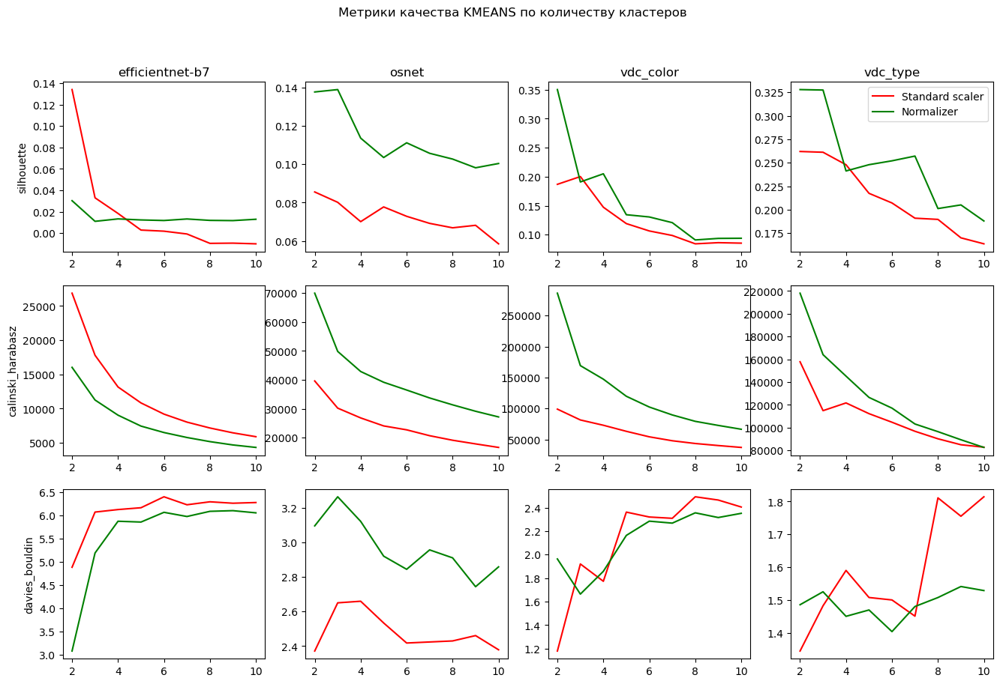

In [17]:
# строим графики для метрик по количеству кластеров

fig, axes = plt.subplots(3, 4, figsize=(16,10))
fig.suptitle('Метрики качества KMEANS по количеству кластеров')

for i, file in enumerate(files):

    silhouette_std = []
    calinski_harabasz_std = []
    davies_bouldin_std = []
    silhouette_norm = []
    calinski_harabasz_norm = []
    davies_bouldin_norm = []

    for n_clusters in range (2,11):
        name_std = file+'-std-kMeans-'+str(n_clusters)
        name_norm = file+'-norm-kMeans-'+str(n_clusters)
        silhouette_std.append(trials[name_std]['silhouette_score'])
        calinski_harabasz_std.append(trials[name_std]['calinski_harabasz_score'])
        davies_bouldin_norm.append(trials[name_std]['davies_bouldin_score'])
        silhouette_norm.append(trials[name_norm]['silhouette_score'])
        calinski_harabasz_norm.append(trials[name_norm]['calinski_harabasz_score'])
        davies_bouldin_std.append(trials[name_norm]['davies_bouldin_score'])
        
    axes[0,i].plot(range(2,11),silhouette_std,'r',label='Standard scaler')
    axes[0,i].plot(range(2,11),silhouette_norm,'g',label='Normalizer')
    axes[1,i].plot(range(2,11),calinski_harabasz_std,'r')
    axes[1,i].plot(range(2,11),calinski_harabasz_norm,'g')
    axes[2,i].plot(range(2,11),davies_bouldin_std,'r')
    axes[2,i].plot(range(2,11),davies_bouldin_norm,'g')

    axes[0,0].set_ylabel('silhouette')
    axes[1,0].set_ylabel('calinski_harabasz')
    axes[2,0].set_ylabel('davies_bouldin')

    axes[0,i].set_title(file)

axes[0,3].legend();



### 3.2. Интерпретация кластеров

#### 3.2.1 Визуализация кластеров

Визуализируйте результаты кластеризации в двух- или трёхмерном пространстве, предварительно понизив размерность дескрипторов изображений до соответствующих размерностей с помощью метода t-SNE. 

По результатам визуализации кластеров сделайте предположение о качестве полученной кластеризации.

In [18]:
# Данный расчет требует значительных вычислительных ресурсов - оценочно от 10 до 24 часов!!!
# если расчет был произведен ранее, загружаем данных из файла

from sklearn.manifold import TSNE

X_tsne = {}

if os.path.isfile(output_path+'X_tsne.pickle'): 
    # Если расчет метрик уже был выполнен - загружаем файл
    X_tsne = pickle.load(open(output_path+'X_tsne.pickle', 'rb'))
else: 
    for _, file in enumerate(X_pca):
        tsne = TSNE(n_components=3, verbose=1, perplexity=30, n_iter=250, random_state=42, n_jobs=-1)
        X_tsne[file] = tsne.fit_transform(X_pca[file])
    # сохраняем результаты    
    with open(output_path+'X_tsne.pickle', 'wb') as handle:
                pickle.dump(X_tsne, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [26]:
# Для интерактивной трехмерной визуализации задайте здесь: 

data_file = 'osnet-norm'   # - имя исходного набора данных
n_clusters = 10  # - количество кластеров из разчетов kMeans выполненных на предидущих шагах

# трехмерная визуализация на случайной выборке 5% исходного количества наблюдений

from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split


def make_tsne_sample(file,n_clusters):

    labels_file = output_path+file+'-kMeans-'+str(n_clusters)+'.pickle'
    y = pickle.load(open(labels_file, 'rb'))['labels']
    X = X_pca[file]
    X_sample,_, labels_sample, _ = train_test_split(X, y, train_size=0.05, random_state=42)
    tsne = TSNE(n_components=3, verbose=0, random_state=42, n_jobs=-1)
    X_tsne_sample = tsne.fit_transform(X_sample)
    return(X_tsne_sample, y)

#for _, file in enumerate(X_pca):
#    for n_clusters in range(2,11): 

X, labels =  make_tsne_sample(data_file,n_clusters)

# 3d scatterplot using plotly
Scene = dict(xaxis = dict(title  = 'X'),yaxis = dict(title  = 'Y'),zaxis = dict(title  = 'Z'))

trace = go.Scatter3d(x=X[:,0], y=X[:,1], z=X[:,2], mode='markers', marker=dict(color = labels, size= 10, line=dict(color= 'black',width = 10)))
layout = go.Layout(margin=dict(l=0,r=0),scene = Scene,height = 1000,width = 1000)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()


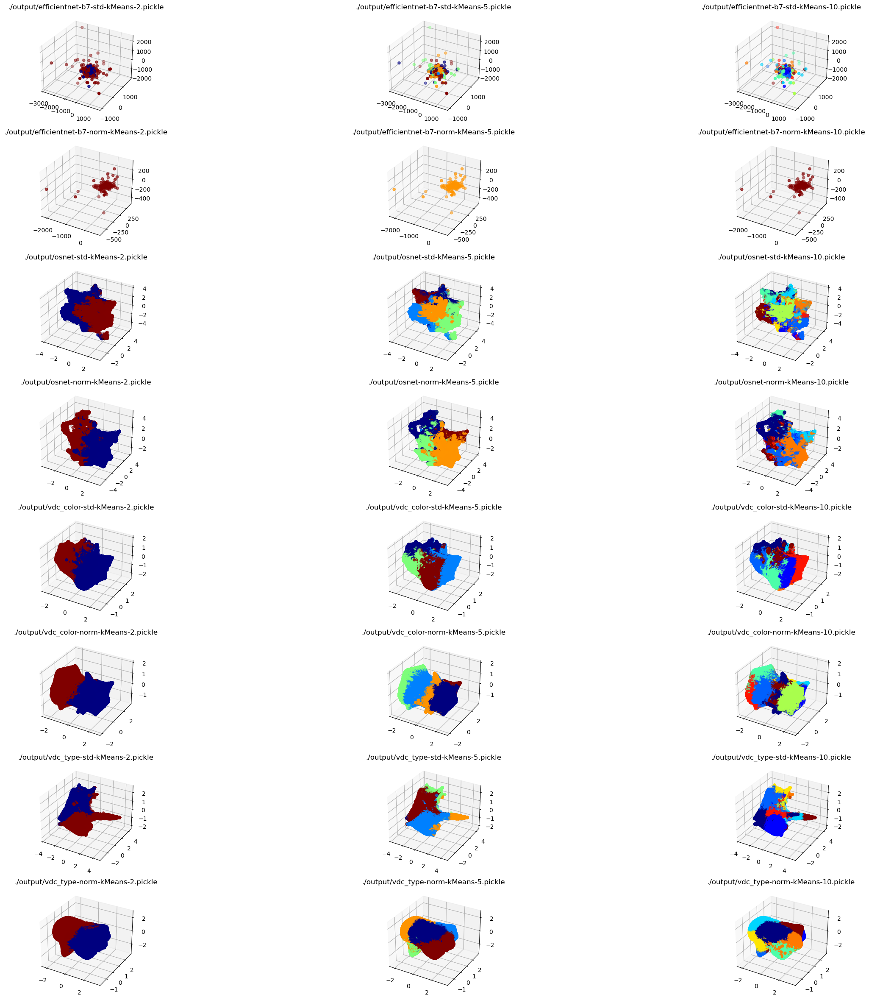

In [28]:
# визуализируем кластеры

X_tsne = pickle.load(open(output_path+'X_tsne.pickle','rb'))

#если файл отсутствует или требуется расчет следует выполнить код в комментарии ниже 

'''
from sklearn.manifold import TSNE

X_tsne = {}

for _, file in enumerate(X_pca):
    tsne = TSNE(n_components=3, verbose=1, perplexity=30, n_iter=250, random_state=42, n_jobs=-1)
    X_tsne[file] = tsne.fit_transform(X_pca[file])

with open(output_path+'X_tsne.pickle', 'wb') as handle:
                pickle.dump(X_tsne, handle, protocol=pickle.HIGHEST_PROTOCOL)
'''


show_case = {
    'files': X_tsne.keys(),
    'n_clusters':[2,5,10]
    }


rows = len(show_case['files'])
cols = len(show_case['n_clusters'])
           
fig = plt.figure(figsize=(30,30))

idx=0

for i, file in enumerate(show_case['files']):
    for j,      n in enumerate(show_case['n_clusters']):              
        idx+=1 
        ax = fig.add_subplot(rows,cols,idx,projection='3d')
        X = X_tsne[file][:,0]
        Y = X_tsne[file][:,1]
        Z = X_tsne[file][:,2]
        labels_file = output_path+file+'-kMeans-'+str(n)+'.pickle'
        
        labels= pickle.load(open(labels_file, 'rb'))['labels']

        ax.scatter(X,Y,Z,c=labels,cmap='jet')
        ax.set_title(labels_file)
     

Вывод: 

X_tsne очень чувствителен к количеству наблюдений и размерности и требует значительных вычислительных ресурсов. Сокращение количества итераций позволило несколько уменьшить время выполнения, но сказалось на качестве. Мы сделали попытку выполнить t-SNE без ограничения количества итерации на случайной выборке и сравнили полученный результат с ранее выполненным расчетом на полных данных и сравнили с изображениеми, полученными на полных данных. В целом, все изображения позволяет оценить качество кластеризации.

Результаты визуализации консистенты с выводами, полученными на основе анализа метрик. Для набора efficient-b7 мы видим, что нормализация привела к потере информации и KMeans отнес все наблюдения к одной группе. Для всех остальных файлов более более четкие границы кластеров с низкой размерностью, по видимому при увеличении размерности ошибки увеличатся.



### 3.2. Интерпретация кластеров

#### 3.2.2. Визуализация изображений в кластере


Визуализируйте несколько изображений из каждого кластера, чтобы проинтерпретировать результаты.

**Как визуализировать изображения, соответствующие определённому кластеру?**

Мы не рассматривали работу с изображениями как отдельную тему, однако не волнуйтесь — в этом нет ничего страшного.

В стандартных библиотеках для визуализации, которые мы изучали ранее, есть встроенный функционал для чтения и визуализации изображений. Например, в библиотеке matplotlib есть функция `plt.imread()`, которая позволяет читать изображение по переданному пути. Она возвращает numpy-массив размерности (h, w, c), где:

* h — высота изображения, 
* w — его ширина,
* c — количество каналов.

Так как все изображения в нашем датасете цветные, каналов (c) три:

* R — матрица интенсивности пикселей красного цвета,
* G — матрица интенсивности пикселей зелёного цвета,
* B — матрица интенсивности пикселей синего цвета.

Например, вот так можно прочитать изображение 000001.jpg:

```python
img = plt.imread('raw_data/veriwild/1/00001/000001.jpg')
print(img.shape)
## (557, 756, 3)
```

То есть изображение состоит из трёх матриц (R, G и B) с размерностью 557 строк на 756 столбцов. Элементами каждой из матриц являются интенсивности пикселей (от 0 до 255) соответствующего цвета.

Что касается вывода изображений на экран, в библиотеке matplotlib есть встроенная функция `plt.imshow()`, которая позволяет вывести переданное ей в аргументы изображение:

```python
fig = plt.figure(figsize=(5, 5))
plt.imshow(img);
```

Функцию `imshow()` можно вызывать и от имени координатных плоскостей при использовании `subplots` из библиотеки `matplotlib`:

```python
img1 = plt.imread('raw_data/veriwild/1/00001/000001.jpg')
img2 = plt.imread('raw_data/veriwild/1/00001/000002.jpg')
fig, axes = plt.subplots(1, 2, figsize=(5, 5))
axes[0].imshow(img1);
axes[1].imshow(img2);
```

После кластеризации для интерпретации результатов вам понадобится визуализировать несколько изображений из каждого кластера. Для этого мы подготовили функцию `plot_sample_cluster_images()`.

In [29]:
def plot_samples_images(file, data, cluster_label, nrows=3, ncols=3, figsize=(12, 5)):
    """Функция для визуализации нескольких случайных изображений из кластера cluster_label.
    Пути до изображений и метки кластеров должны быть представлены в виде DataFrame со столбцами "paths" и "cluster".


    Args:
        data (DataFrame): таблица с разметкой изображений и соответствующих им кластеров.
        cluster_label (int): номер кластера изображений.
        nrows (int, optional): количество изображений по строкам таблицы (по умолчанию 3).
        ncols (int, optional): количество изображений по столбцам (по умолчанию 3).
        figsize (tuple, optional): размер фигуры (по умолчанию (12, 5)).

    """
    # Фильтруем данные по номеру кластера
    samples_indexes = np.array(data[data['cluster'] == cluster_label].index)
    # Перемешиваем результаты
    np.random.shuffle(samples_indexes)
    # Составляем пути до изображений
    paths = data.loc[samples_indexes, 'paths']
   
    # Создаём фигуру и набор координатных плоскостей
    fig, axes = plt.subplots(nrows,ncols)
    # Устанавливаем размер фигуры
    fig.set_size_inches(*figsize)
    # Устанавливаем название графика
    fig.suptitle(f"Images for {file} from cluster {cluster_label}", fontsize=16)
    # Создаём цикл по строкам в таблице с координатными плоскостями
    for i in range(nrows):
        # Создаём цикл по столбцам в таблице с координатными плоскостями
        for j in range(ncols):
            # Определяем индекс пути до изображения
            path_idx = i * ncols + j
            if path_idx >= len(paths):
                break
            # Извлекаем путь до изображения
            path = paths.iloc[path_idx]
            # Читаем изображение

            img = plt.imread(path)
            
            # Отображаем его на соответствующей координатной плоскости
            axes[i,j].imshow(img)
            # Убираем пометки координатных осей
            axes[i,j].axis('off')


Например, вы произвели кластеризацию и записали пути до изображений в виде столбца "paths" и метки кластеров в виде столбца "cluster" в некоторый DataFrame с именем data. Тогда, чтобы визуализировать несколько случайных изображений из кластера 0, вам нужно вызвать функцию `plot_sample_cluster_images()` следующим образом:

```python
plot_samples_images(data=data, cluster_label=0)
```

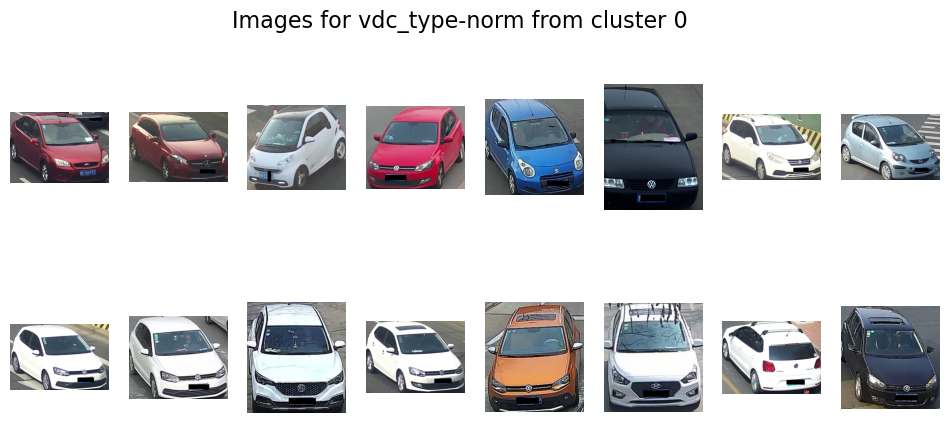

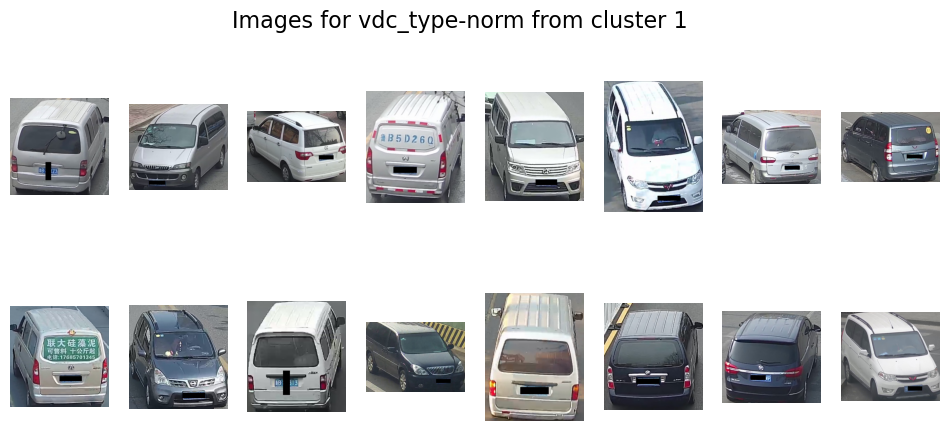

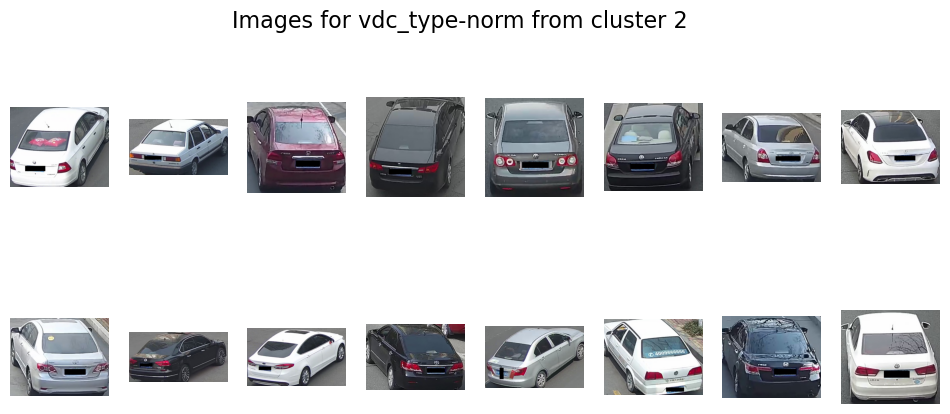

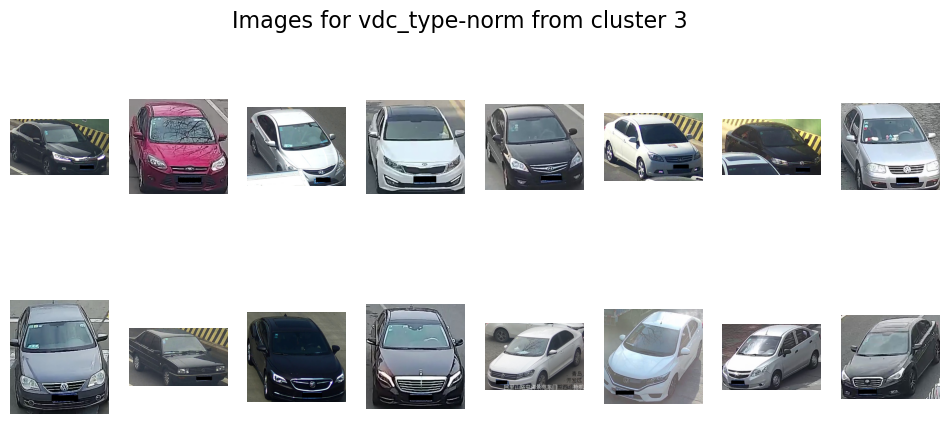

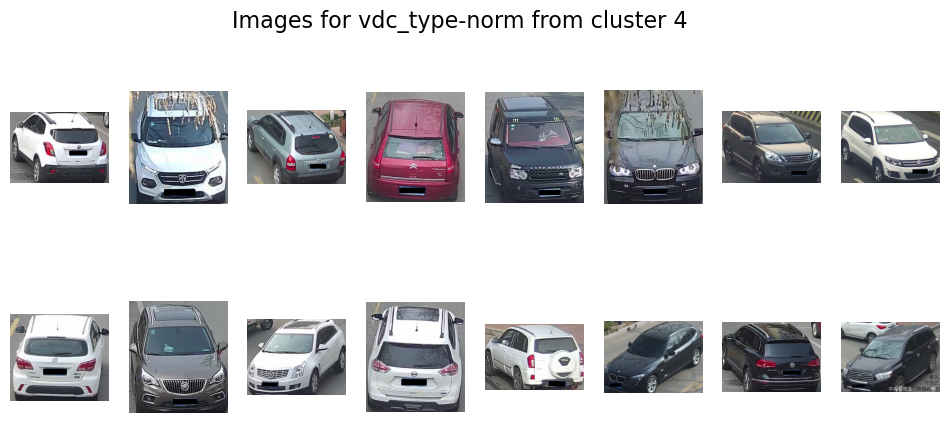

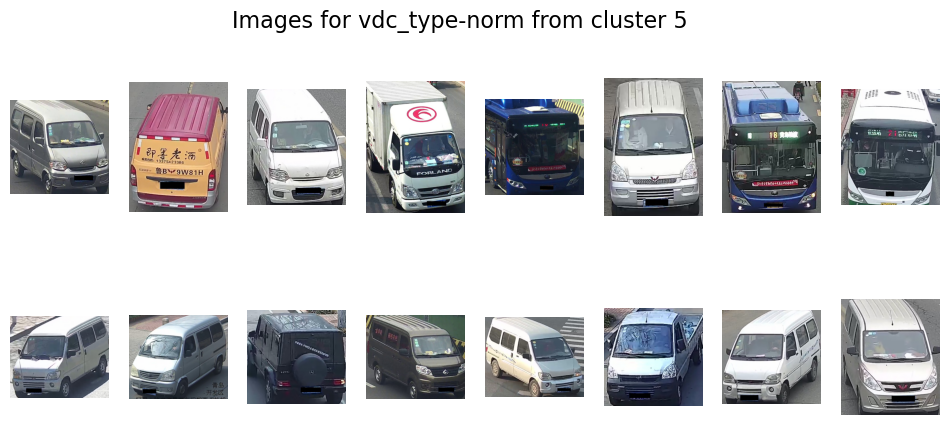

In [33]:

file = 'vdc_type-norm'
n_clusters = 6


images_paths = pd.read_csv(open(input_path+'images_paths.csv'))
labels_file = output_path+file+'-kMeans-'+str(n_clusters)+'.pickle'
labels = pickle.load(open(labels_file, 'rb'))['labels']
images_paths = pd.concat([images_paths, pd.DataFrame(labels, columns=['cluster'])], axis=1)

images_paths['paths'] = images_paths['paths'].apply(lambda x : input_path+'raw_data/'+x.replace('\\','/'))



for label in range(n_clusters):
    plot_samples_images(file,images_paths,label,nrows=2, ncols=8, figsize=(12, 5)) 

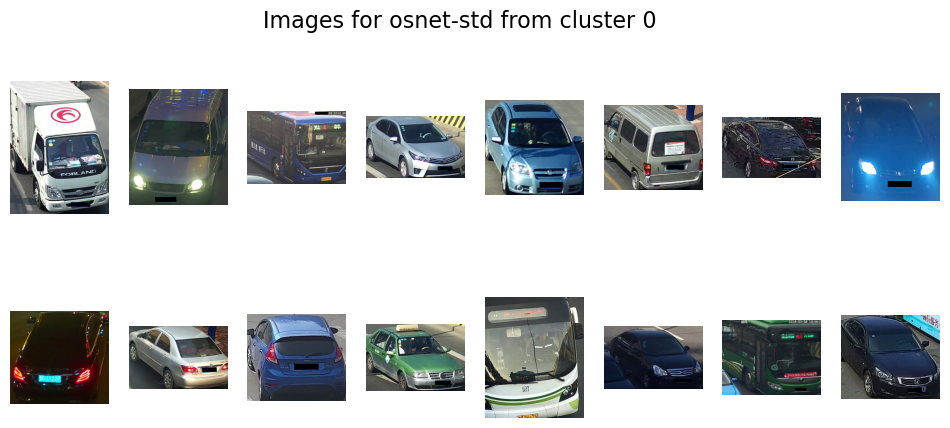

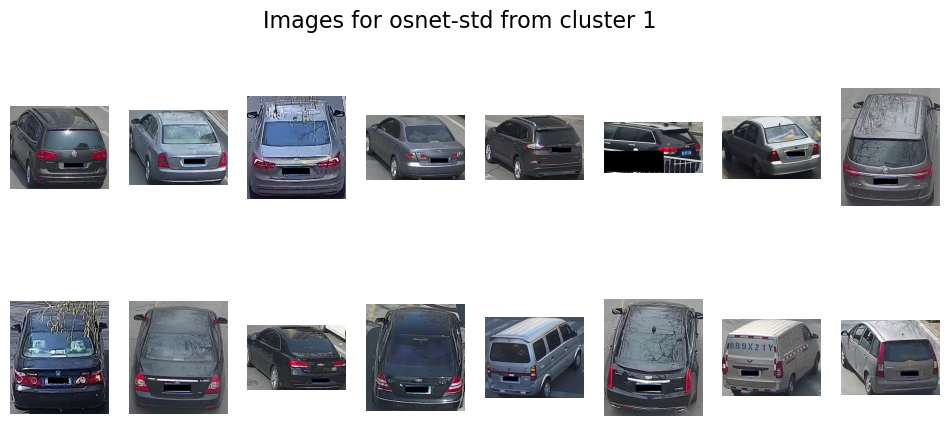

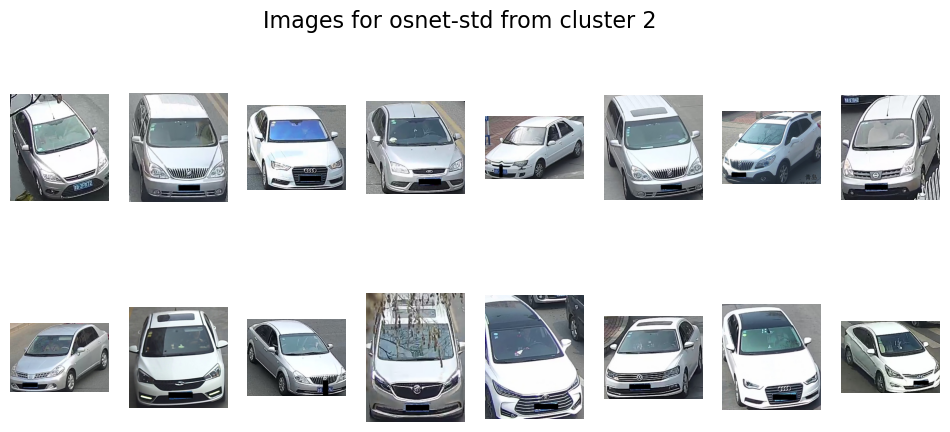

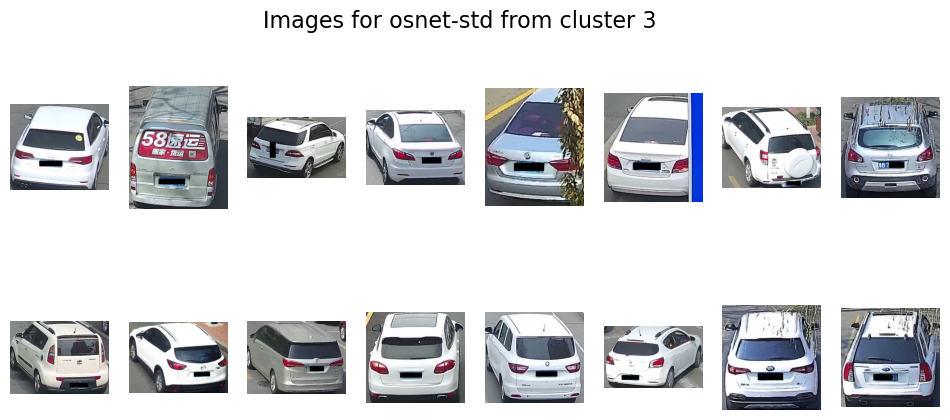

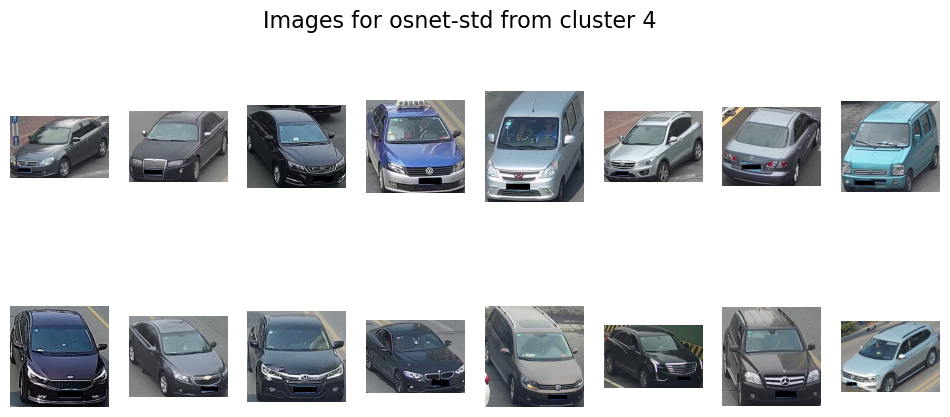

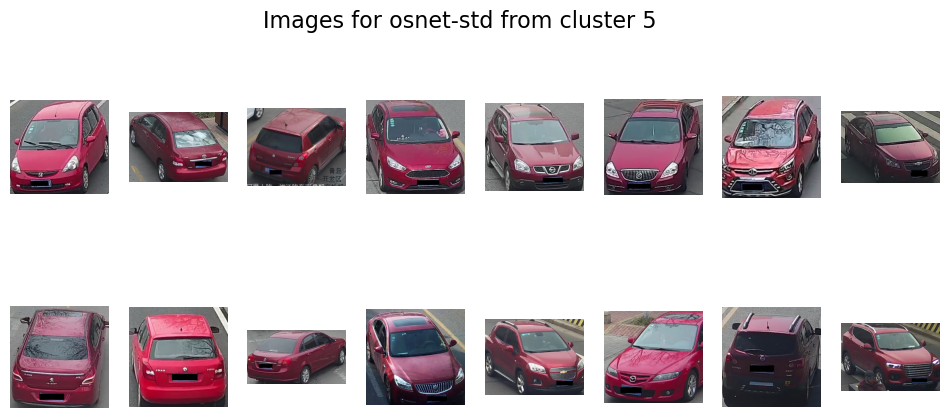

In [34]:

file = 'osnet-std'
n_clusters = 6

images_paths = pd.read_csv(open(input_path+'images_paths.csv'))
labels_file = output_path+file+'-kMeans-'+str(n_clusters)+'.pickle'
labels = pickle.load(open(labels_file, 'rb'))['labels']
images_paths = pd.concat([images_paths, pd.DataFrame(labels, columns=['cluster'])], axis=1)

images_paths['paths'] = images_paths['paths'].apply(lambda x : input_path+'raw_data/'+x.replace('\\','/'))



for label in range(n_clusters):
    plot_samples_images(file,images_paths,label,nrows=2, ncols=8, figsize=(12, 5)) 

### 3.3. Поиск выбросов

С помощью известных вам методов поиска выбросов (например, DBSCAN) попытайтесь найти выбросы среди изображений, используя все варианты дескрипторов. Подберите параметры алгоритма.

Визуализируйте изображения, попавшие в раздел выбросов, и попробуйте проинтерпретировать полученные результаты. Подумайте, почему именно эти изображения попали в выбросы.

Сравните результаты для всех вариантов дескрипторов. Какой вариант дескрипторов даёт наилучшее представление о выбросах?



In [38]:
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

def dbscan_preprocessing(data, n_features):
#Scaling and reducing dimentions of source data
    results = {}
    for _, file in enumerate(data):
        std = StandardScaler()
        X_scaled=std.fit_transform(data[file])
        X_pca = PCA(n_components=n_features, random_state=42).fit(X_scaled)
        X_pca = X_pca.transform(X_scaled)   
        results[file] = X_pca
    return results

if os.path.isfile(output_path+'X_pca_dbscan.pickle'): 
    # Если расчет метрик уже был выполнен - загружаем файл
    print('Загружаем ',output_path+'X_pca_dbscan.pickle')
    X_pca = pickle.load(open(output_path+'X_pca_dbscan.pickle', 'rb'))
else: 
    print('Выполняем расчет ',output_path+'X_pca_dbscan.pickle')
    n_features = 2
    X_pca = dbscan_preprocessing(data, n_features )
    with open(output_path+'X_pca_dbscan.pickle', 'wb') as handle:
        pickle.dump(X_pca, handle, protocol=pickle.HIGHEST_PROTOCOL)

Выполняем расчет  ./output/X_pca_dbscan.pickle


In [39]:
# применим DBSCAN для поиска выбросов

X_pca = pickle.load(open(output_path+'X_pca.pickle','rb'))


def do_dbscan(X,eps=None,min_samples=None,frac=None):
# Параметры :
#        X - исходные данные (dataframe or np.array)
#        eps - параметр dbscan
#        min_samples - параметр dbscan
#        frac - количество частей для разбиения исходных данных
    
    labels = np.array([])

    # большой объем и высокая плотность не позволили провести обработку некоторых наборов целиком
    # исходный набор был разбит на несколько частей
    chunks = np.array_split(X,frac)
    for chunk in chunks:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples, algorithm='auto',n_jobs=-1).fit(chunk)
        labels = np.append(labels,dbscan.labels_,axis=0)
    return (pd.DataFrame(labels) )

# параметры подобраны путем экспериментов: следили за количество выделенных выбросов при различных комбинациях
params ={'efficientnet-b7-std':{'eps':70,
                                'min_samples':3},
         'efficientnet-b7-norm':{'eps':1.17,
                                'min_samples':3},
          'osnet-std':{'eps':35,
                                'min_samples':3},
          'osnet-norm':{'eps':0.54,
                                'min_samples':3},
          'vdc_color-std':{'eps':11,
                                'min_samples':3}, 
          'vdc_color-norm':{'eps':0.3,
                                'min_samples':3},
          'vdc_type-std':{'eps':15,
                                'min_samples':3},
          'vdc_type-norm':{'eps':0.35,
                                'min_samples':3}}

for _, file in enumerate(params):
    file_name = output_path+'dbscan_labels_'+file+'.pickle'
    print('file_name=',file_name)
    if os.path.isfile(file_name): 
        print ('Расчет уже был выполнен - загружаем файл')
        with open(file_name, 'rb')  as handle:
            labels = pickle.load(handle)
    else: 
        eps=params[file]['eps']
        min_samples = params[file]['min_samples']
        print('Выполняем расчет ',file, eps, min_samples)
        labels = do_dbscan(X_pca[file],frac=10,eps=eps, min_samples=min_samples)
        with open(file_name, 'wb') as handle:
            pickle.dump(labels, handle, protocol=pickle.HIGHEST_PROTOCOL)
    print (file, labels.value_counts())

file_name= ./output/dbscan_labels_efficientnet-b7-std.pickle
Расчет уже был выполнен - загружаем файл
efficientnet-b7-std  0.0    414797
-1.0      1517
dtype: int64
file_name= ./output/dbscan_labels_efficientnet-b7-norm.pickle
Расчет уже был выполнен - загружаем файл
efficientnet-b7-norm  0.0    414200
-1.0      2114
dtype: int64
file_name= ./output/dbscan_labels_osnet-std.pickle
Расчет уже был выполнен - загружаем файл
osnet-std  0.0    416262
-1.0        49
 1.0         3
dtype: int64
file_name= ./output/dbscan_labels_osnet-norm.pickle
Расчет уже был выполнен - загружаем файл
osnet-norm  0.0    415163
-1.0       918
 1.0        49
 4.0        47
 2.0        41
 5.0        39
 3.0        37
 6.0        20
dtype: int64
file_name= ./output/dbscan_labels_vdc_color-std.pickle
Расчет уже был выполнен - загружаем файл
vdc_color-std  0.0    415088
-1.0      1126
 1.0        39
 2.0        35
 3.0        17
 4.0         9
dtype: int64
file_name= ./output/dbscan_labels_vdc_color-norm.pickle
Ра

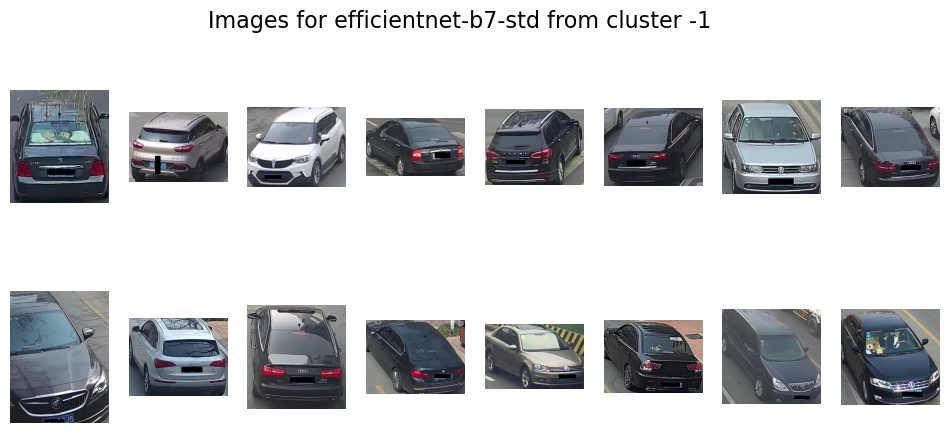

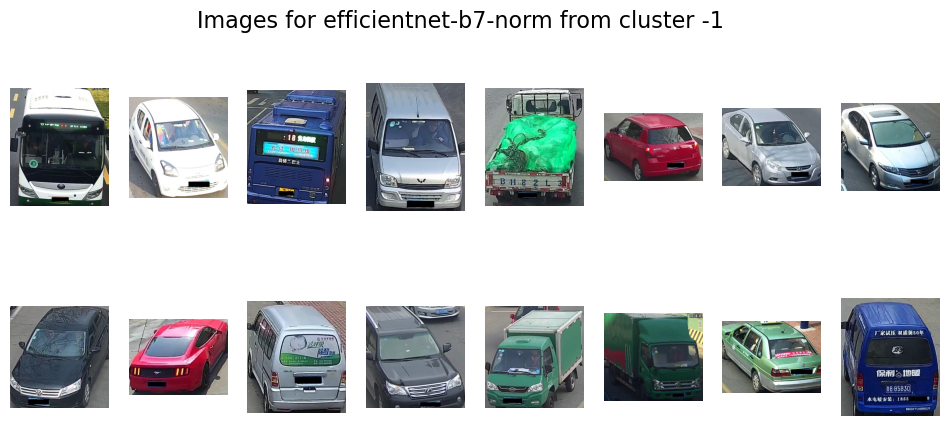

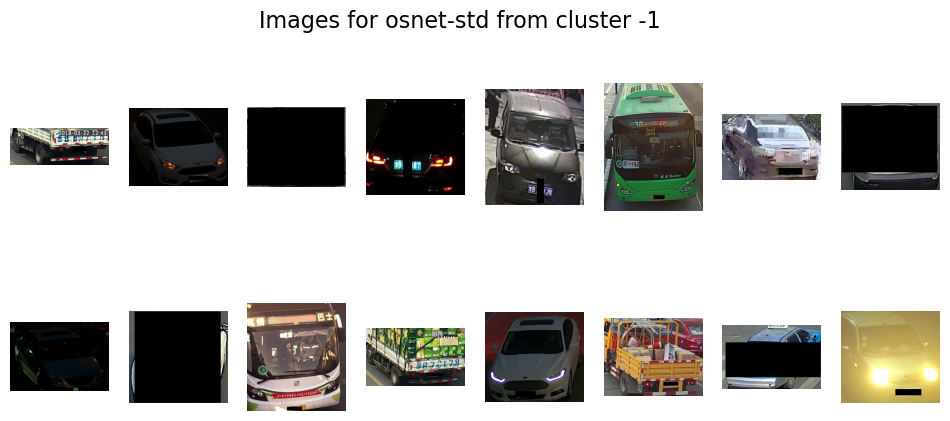

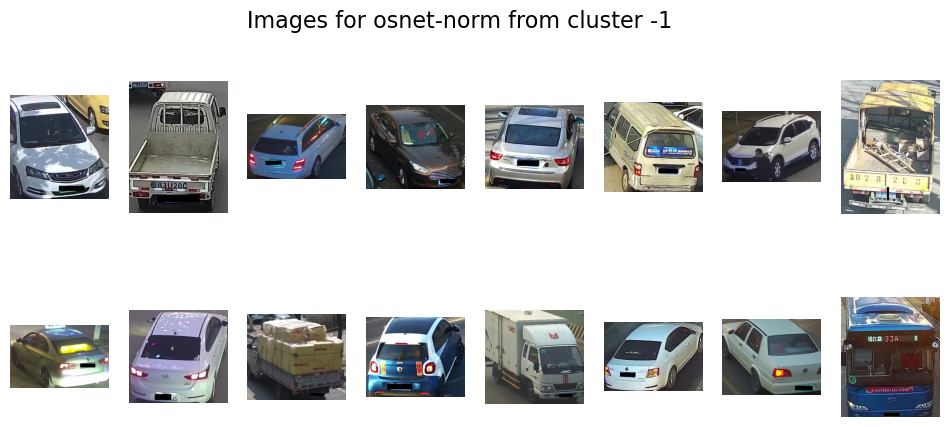

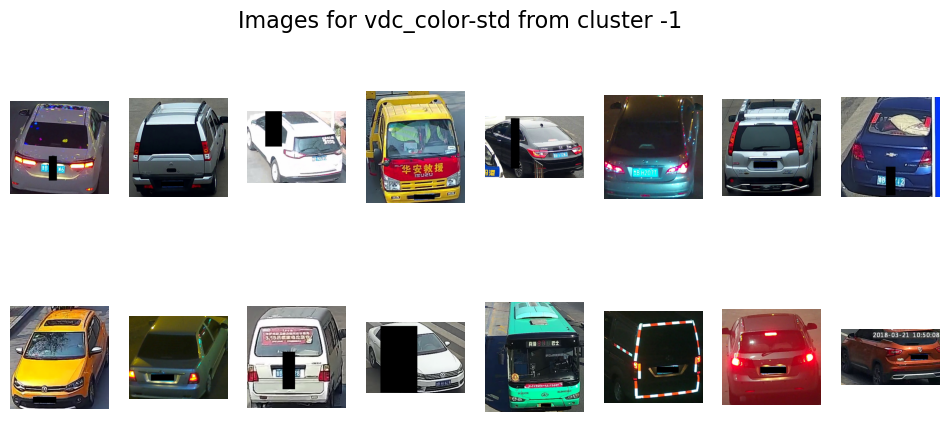

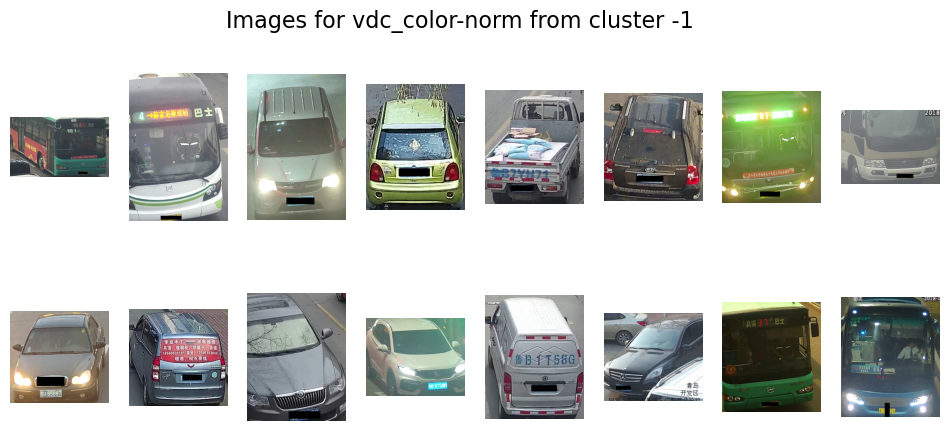

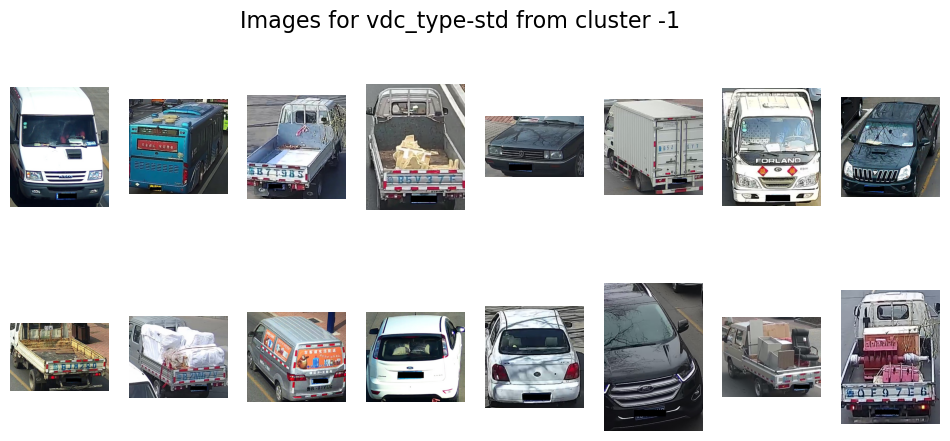

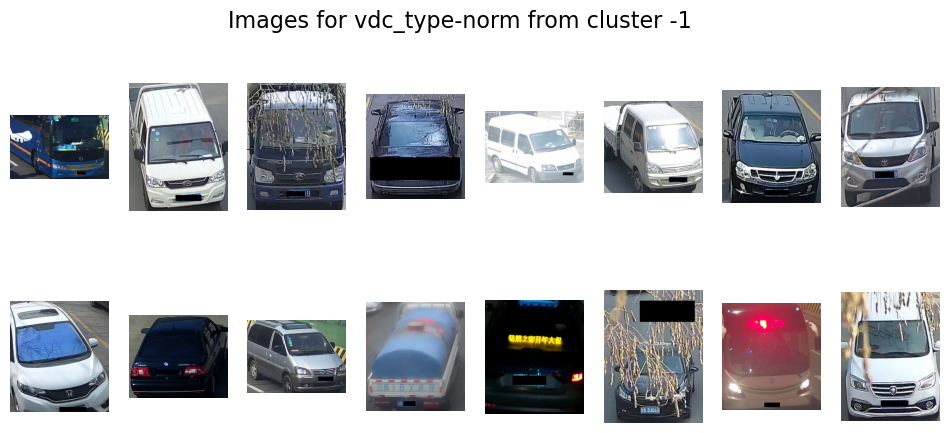

In [40]:
# Visualising outliners

for _, file in enumerate(params):
   
    file_name = output_path+'dbscan_labels_'+file+'.pickle'

    images_paths = pd.read_csv(open(input_path+'images_paths.csv'))
    with open(file_name, 'rb')  as handle:
            labels = pickle.load(handle)\
            
    images_paths['cluster'] = labels[0].values
    images_paths['paths'] = images_paths['paths'].apply(lambda x : input_path+'raw_data/'+x.replace('\\','/'))

    plot_samples_images(file, images_paths,-1,nrows=2, ncols=8, figsize=(12, 5)) 

Вывод: Визуально osnet-std показывает лучшее выделение выбросов. Большая часть изображений выделенных DBSCAN как выбросы содержит либо дефекты изображения, либо посторонние предметы, либо темное время суток, либо только часть транспортного средства, либо нестандартное транспортное средство. При этом нужно отметить, что четкого разделения не произошло. Причиной этого вероятнее всего было то, что параметры DBSCAN значительно влияют на разделение и было очень трудно подобрать значения. Кроме того, на полном наборе данных алгоритм sklearn вызывал падение ядра. Скорее всего это было вызвано переполнением памяти, так как данные размещены очень плотно. Исходный набор данных был разбит на 10 фолдеров, что позволило решить проблему скорости выполнения - DBSCAN имеет N*LogN (N2) сложность. Такой прием пригоден для поиска выбросов но не подходит для кластеризации. 

## 4. Выводы и оформление проекта

На основе результатов, полученных при выполнении проекта, сделайте вывод по задаче, приведя таблицу со сравнением результатов кластеризации на каждом из наборов дескрипторов. Приведите сравнение вариантов предобработки исходных данных по качеству кластеризации.

Результатом вашей работы должно стать небольшое исследование, в котором вы даёте команде IntelliVision рекомендации, какие дескрипторы, с какой предобработкой и каким алгоритмом кластеризации лучше всего подходят для решения задачи.

Также сохраните результаты лучшего алгоритма в CSV-файл со столбцами path (путь до изображения) и cluster (номер кластера). В описании к проекту приведите расшифровку каждого из кластеров.

Когда вы закончите выполнять проект, создайте в своём репозитории файл README.md и кратко опишите содержание проекта по принципу, который мы приводили ранее.

Выложите свой проект на GitHub и оформите удалённый репозиторий, добавив в него описание и теги (придумайте их самостоятельно в зависимости от того, какую задачу вы решали).

Мы получили кластеры методом kMeans с использованием стандартизации, нормализации и затем понижения размерности методом PCA объясняющим 90% разброса исходных данных. К сожалению, не удалось получить результаты кластеризации другими методами библиотеки sklearn вследствие проблем в kernel и значительного времени вычислений: большинство методов имеет вычислительную сложность N**2 или NlogN.  

Для разных исходных дескрипторов на основе критериев можно сделать следующие выводы:
    - efficient-b7: все три индекса показывают лучшее разделение при наименьшем количестве 2 кластера. При этом значения метрик указывают на низкое качество разделения. 
    - osnet: Метод силуэта и калински-харабаз метрики указывают на разбиение с меньшим количеством кластеров. При этом метрика дейвис-боулдина показыват возможность лучшего разделения при больших количествах кластеров.
    - vdc_color: все три метрики консистентно показывают лучшие значения для 2-3 кластеров.
    - vdc_type: также 2-3 кластера показывают лучшее разделение.

Для всех случаев общим является факт низкого качества разделения данных. Для efficient-b7 лучший результат показывает StandardScaler для остальных файлов Normalizer.

По-видимому, при выборе количества кластеров в данном случае следует исходить из содержательных целей проекта, например, разделение автомобилей по цвету, марке, углу зрения и тп, и затем определять лучший метод обработки.

Также, большое значение имеет подбор параметров алгоритмов, что можно увидеть на примере DBSCAN в задаче поиска выбросов.